In [4]:
import numpy as np
import random
from random import randint
from random import randrange
from numpy.random import normal
import matplotlib.pyplot as plt
%matplotlib inline

import graspy
from graspy.simulations import sbm
from graspy.plot import heatmap

def data_generator(num_graphs, N, n, wt, wtargs, prob_tensor, percent_vec, lister_c_i):

    # Getting the number of classes
    num_types = len(percent_vec)

    # Getting vector with the number of graphs in each class
    num = [int(num_graphs * a) for a in percent_vec]

    # Creating blank arrays for all of the returns
    data = np.zeros((num_graphs, N, N))
    y_label = np.zeros((num_graphs, 1))

    # Creates vector of random indices to randomly distribute graphs in tensor
    L_ind = random.sample(range(num_graphs), num_graphs)

    # Counter to know when on second type
    counter = 0
    
    # Loop for creating the returns
    for i in range(num_types):

        # Create tensor that will contain all of the graphs of one type
        types = np.zeros((num[i], N, N))

        # Put all the graphs of one type into types
        for j in range(len(types)):
            types[j] = sbm(n=n, p=prob_tensor[i], wt=wt, wtargs=wtargs)

        if counter > 0:    
            c_i = lister_c_i[0] * 25
            c_j = lister_c_i[1] * 25
                
            for k in range(len(types)):
                types[k, c_i:c_i + 25, c_i:c_i + 25] = sbm(n=[25], p=[[1]], wt=[[normal]], wtargs=[[dict(loc=0.2, scale=0.18)]])
                types[k, c_j:c_j + 25, c_j:c_j + 25] = sbm(n=[25], p=[[1]], wt=[[normal]], wtargs=[[dict(loc=0.2, scale=0.18)]])
                types[k, c_i:c_i + 25, c_j:c_j + 25] = sbm(n=[25], p=[[1]], wt=[[normal]], wtargs=[[dict(loc=0.2, scale=0.18)]])
                types[k, c_j:c_j + 25, c_i:c_i + 25] = sbm(n=[25], p=[[1]], wt=[[normal]], wtargs=[[dict(loc=0.2, scale=0.18)]])
                

        # Assigns all of the graphs in types to random indices in data
        data[L_ind[: num[i]]] = types

        # Creates corresponding labels
        y_label[L_ind[: num[i]]] = int(i)

        # Gets rid of used indices
        L_ind = L_ind[num[i] :]

        counter += 1
        
    return data, y_label

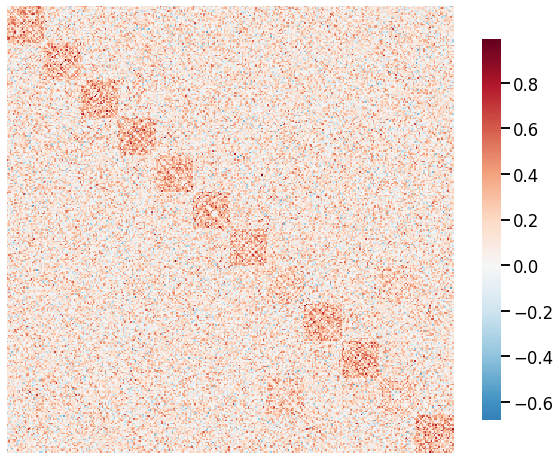

In [5]:
import random
n = [25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25]
percent_vec = np.asarray([0.50, 0.50])
prob_tensor = np.zeros((2, 12, 12))

prob_tensor[0] = np.ones((12, 12))
prob_tensor[1] = np.ones((12, 12))

wt = [[normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal],
      [normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal, normal]]

wtargs = [[dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18), dict(loc=0.1, scale=0.18)],
          [dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.1, scale=0.18), dict(loc=0.3, scale=0.18)]]

v1, v2 = random.sample(range(0, 12), 2)
lister_c_i = [v1, v2]

dat_obj_train = data_generator(100, 300, n, wt, wtargs, prob_tensor, percent_vec, lister_c_i)
dat_obj_test = data_generator(100, 300, n, wt, wtargs, prob_tensor, percent_vec, lister_c_i)

heatmap(dat_obj_train[0][0])

In [6]:
x = np.zeros((100, 44850))
xtest = np.zeros((100, 44850))

y = dat_obj_train[1]
ytest = dat_obj_test[1]

for i in range(len(x)):
    tmp_train = dat_obj_train[0][i]
    tmp_train[np.tril_indices(tmp_train.shape[0])] = -50
    tmp_train = tmp_train.flatten('F')
    x[i] = tmp_train[np.where(tmp_train != -50)]

    tmp_test = dat_obj_test[0][i]
    tmp_test[np.tril_indices(tmp_test.shape[0])] = -50
    tmp_test = tmp_test.flatten('F')
    xtest[i] = tmp_test[np.where(tmp_test != -50)]

In [7]:
from graspy.subgraph import SparseOpt
obj = SparseOpt()
print(x.shape)
obj.fit(x, y, xtest, ytest)

ImportError: cannot import name 'SparseOpt' from 'graspy.subgraph' (/usr/local/lib/python3.7/dist-packages/graspy-0.2.0-py3.7.egg/graspy/subgraph/__init__.py)